#### Explore the Application of Diffusion Model in Video Content Creation
#### 03 - Completed Application in Video Content Creation
##### Haiyun Xiao  hxiao8@hawk.iit.edu
##### Yu Li  yli385@hawk.iit.edu
##### Haichen Pang - hpang3@hawk.iit.edu


#### According to the theme of the project, we conducted theoretical research on the diffusion model, the corresponding code implementation, and the completion of the final project.

1. We designed a video scene dialogue script (can also be generated using chatGPT)
   
2. Use Stable Diffusion to generate a picture of the character (can also use stability ai to generate it)
   
3. Use FakeYou API to generate voices for the characters
   
5. FFmpeg connects the images and voices into a movie


#### 1. Complete Application in Video Content Creation.

##### References

- Books & Websites
  
  - https://ayandas.me/blog-tut/2021/12/04/diffusion-prob-models.html
    
  - https://api.openai.com

  - https://api.stability.ai
  
  - https://api.fakeyou.com
    
  - https://github.com/huggingface/diffusion-models-class
    

In [1]:
# Code execution environment
# python version 3.10.5
# MPS acceleration is available on MacOS 12.3+
# conda install pytorch::pytorch torchvision torchaudio -c pytorch
# %pip install scikit-learn
# %pip install matplotlib
# %pip install diffusers
# %pip install ipywidgets
# %pip install transformers scipy ftfy
# %pip install huggingface_hub
# %pip install modelscope  
# %pip install opencv-python
# %pip install accelerate
# %pip install datasets
# %pip install torchaudio
# %pip install -q diffusers torch librosa datasets
# %pip install  ffmpeg-python

In [2]:
import sys
sys.path.append('functioncode')
import tomllib
import toml
import character_model
from character_tts import get_possible_characters_from_prompt
from character_input import select_characters
from character_script_generator import generate_script


#### The pipeline process of video production:

##### Define selectable roles -> Provide prompt word scenes -> Select specific roles based on prompt word scenes -> 
##### Generate dialogue scripts for the characters -> Generate dialogue scripts into voices -> 
##### Generate character scene pictures -> Generate background music -> 
##### Synthesize video

In [3]:
with open('./config/characters.toml', 'rb') as f:
    curated_characters = tomllib.load(f)
    print("Configured in stable diffusion and FakeYou are more popular characters:\n")
    for character_name in curated_characters.keys():
        print(f'  #{character_name}')

Configured in stable diffusion and FakeYou are more popular characters:

  #GLaDOS
  #Homer Simpson
  #Samuel L. Jackson
  #Morgan Freeman
  #Wallace
  #Yugi
  #Shrek
  #Yoda
  #Weird Al
  #Joey Wheeler
  #Seto Kaiba
  #Tristan Taylor
  #Mokuba Kaiba
  #Mai Valentine
  #Mario
  #Luigi
  #Bill Nye
  #Wario
  #Slippy Toad
  #Voldemort
  #Kurzgesagt
  #Donkey
  #Tobey Maguire
  #Gandhi
  #Donald Trump
  #Barack Obama
  #Jack Sparrow
  #Jaiden Animations
  #Shaggy Rogers
  #Scooby Doo
  #Ash Ketchum
  #Meowth
  #Queen Elizabeth II
  #Elon Musk
  #TheOdd1sOut


In [ ]:
script_file = None

if script_file == None:
    prompt = 'Musk tells Trump the story of landing on Mars'
    # 获取角色 Get character
    possible_characters = get_possible_characters_from_prompt(prompt)
    # # 获取角色的对话脚本 Get the character's dialogue script
    characters = select_characters(possible_characters, high_quality_audio=True, full_auto=False)
    # # 请gpt生成剧情脚本 Please gpt generate plot script
    script = generate_script(characters, prompt)

else:
    with open(script_file, "rb") as f:
        script = tomllib.load(f)

print(f'The Script used generate the video as below:\n {toml.dumps(script)}')

In [5]:
from character_model import Character, Line

characters = [Character(
        character['name'],
        voice_token=character['voice_token'],
        default_image_prompt=character['default_image_prompt']
    ) for character in script['characters']]

def find_character(name: str):
        return next(filter(lambda character: character.name == name, characters))

lines = [Line(
        character=find_character(line['character']),
        speech=line['speech'],
        image_prompt=line.get('image_prompt', None) or find_character(line['character']).default_image_prompt
    ) for line in script['lines']]

In [ ]:
from IPython.display import Audio, display
from character_tts import generate_voice_clips

generate_voice_clips(lines, characters)

voiceovers =  [f"./tmp/{i+1}.wav" for i in range(len(lines))]
for voice in voiceovers:
    display(Audio(voice))

In [7]:
# we can also use the Stability API to generate static images for all dialogue scenes.
# it can alse use the locally deployed Stable Diffusion model in notebook 02 for image generation.
# The locally deployed pre-trained model is relatively small, and the effect of generating images is general.

In [ ]:
import glob,os
from IPython.display import Image
from stability import generate_image
from tqdm import tqdm


counter = 1
for line in tqdm(lines, desc="Generating images"):
    prefix = f"./tmp/{counter}__"
    generate_image(prompt=line.image_prompt + ', ' + "on the sitcom how I met your mother (1993)", prefix=str(prefix), width=1024, height=1024)
    counter += 1

images = glob.glob('./tmp/*.png')
images.sort(key=os.path.getmtime)
for image in images:
    display(Image(image))

In [8]:
from freepd import MusicCategory, download_random_music
bgm = download_random_music(script.get('bgm_category', None) or random.choice(MusicCategory.values()))

Downloaded Jungle Mission successfully.


In [8]:
# Use ffmpeg to merge all the voice clips and images to generate a short video.

In [ ]:
from ffmpg import generate_movie
import os, glob
from character_model import SpeechClip

movie_data = [SpeechClip(
    caption=line.speech,
    image=image,
    audio=voiceover,
) for line, image, voiceover in zip(lines, images, voiceovers)]

if(not os.path.exists('./renders/')):
    os.makedirs('./renders/')
output_path = "./renders/output.mp4"

generate_movie(movie_data, bgm, './LGSmHaSB.ttf', output_path)

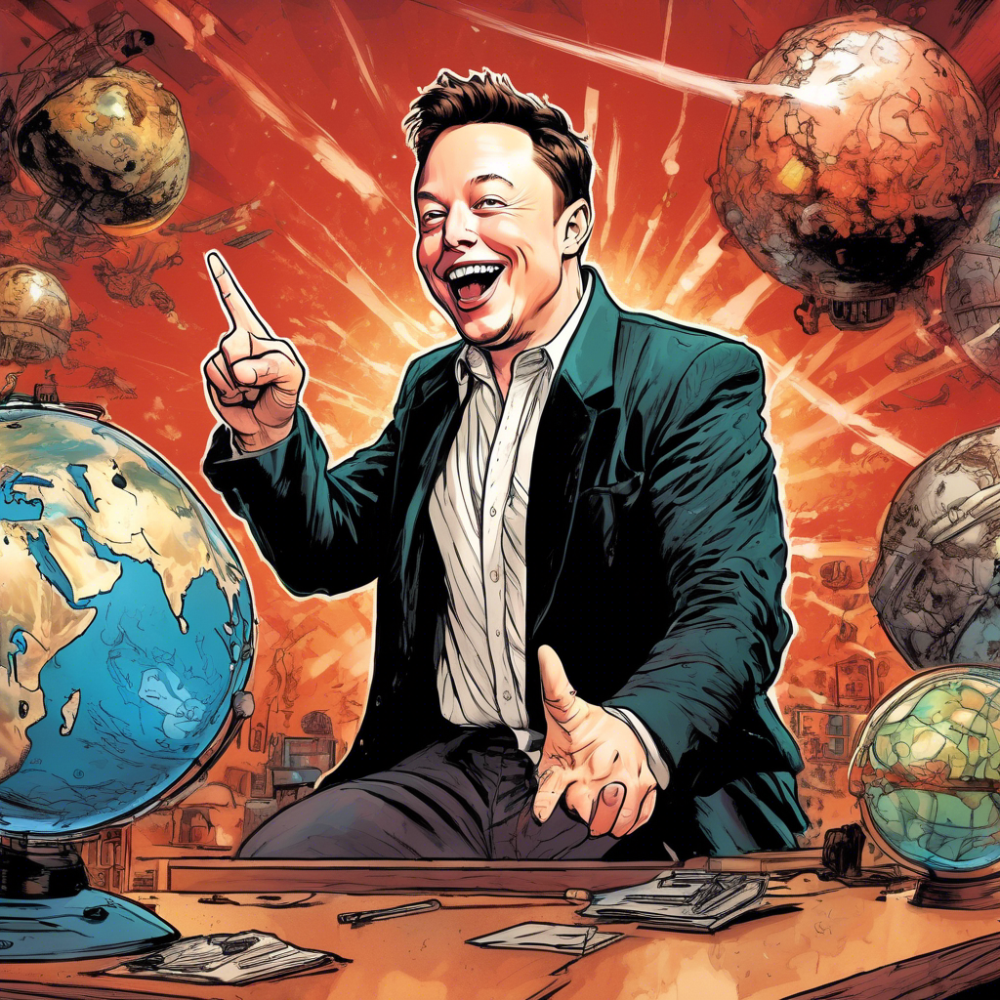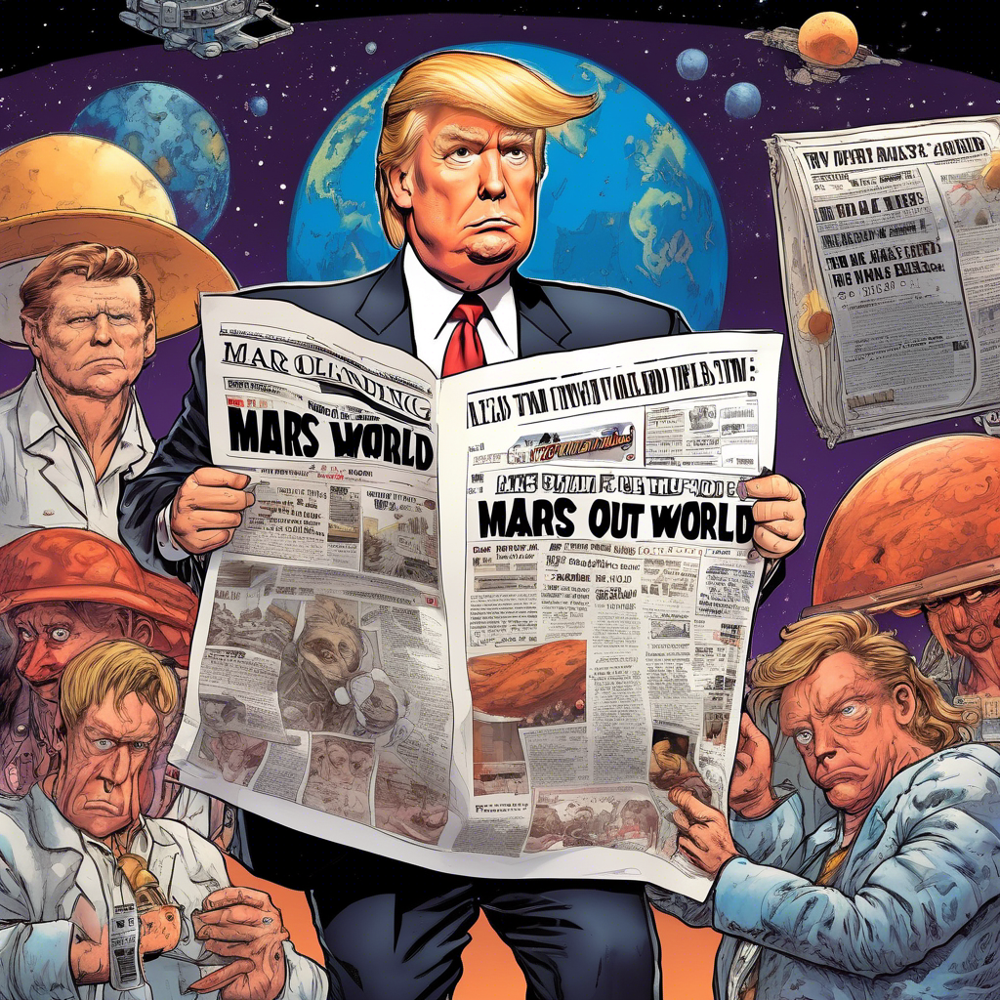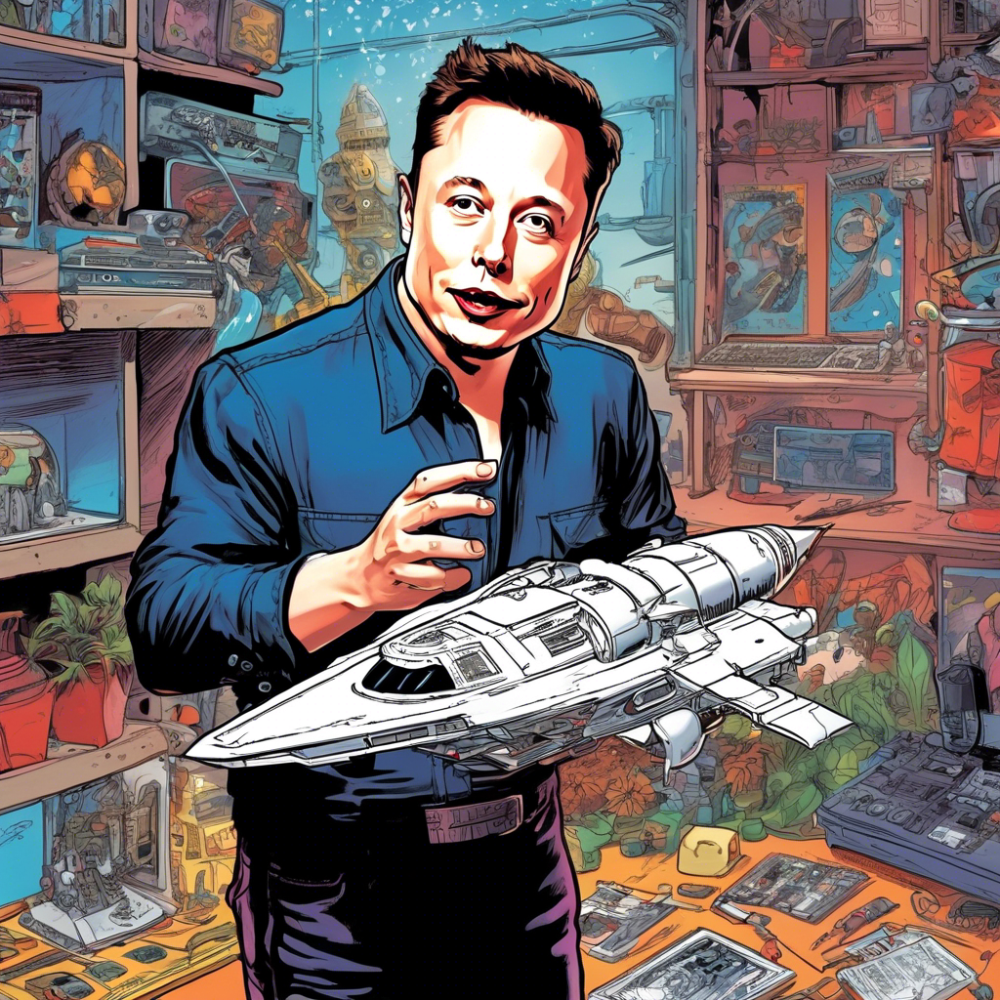
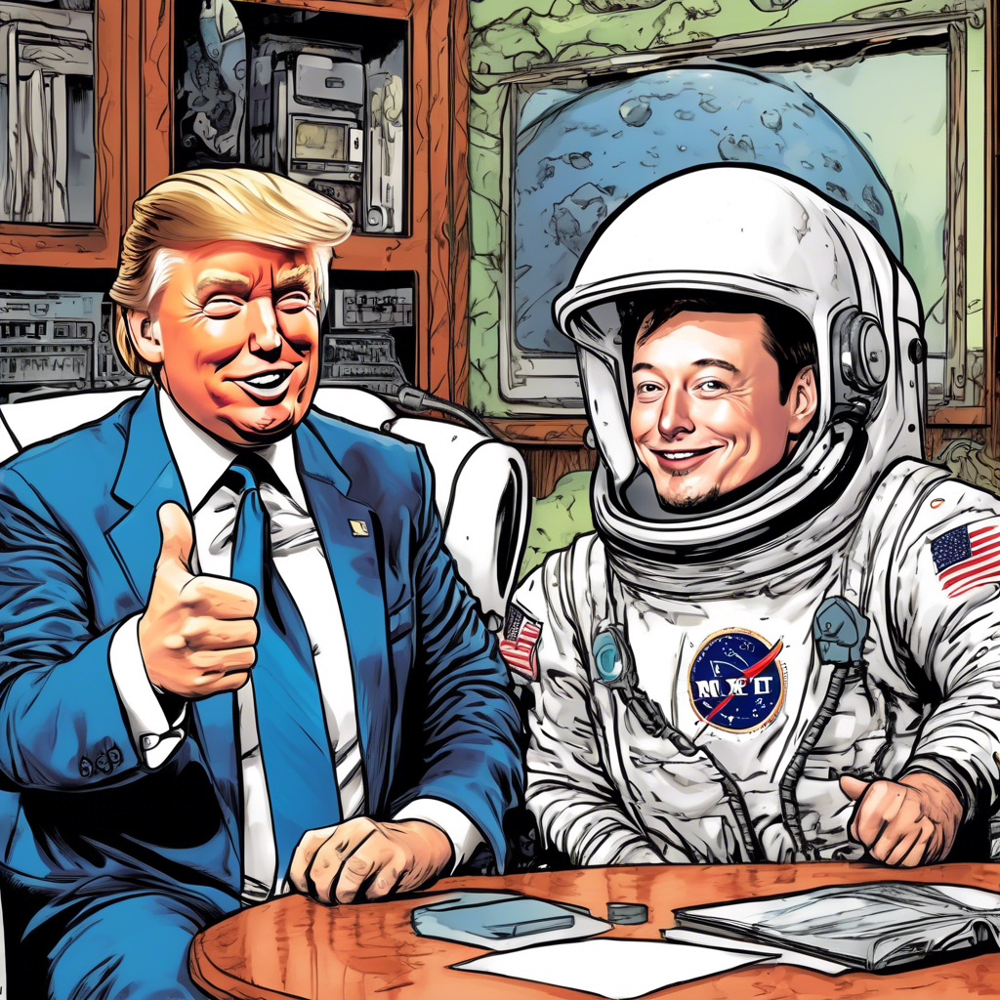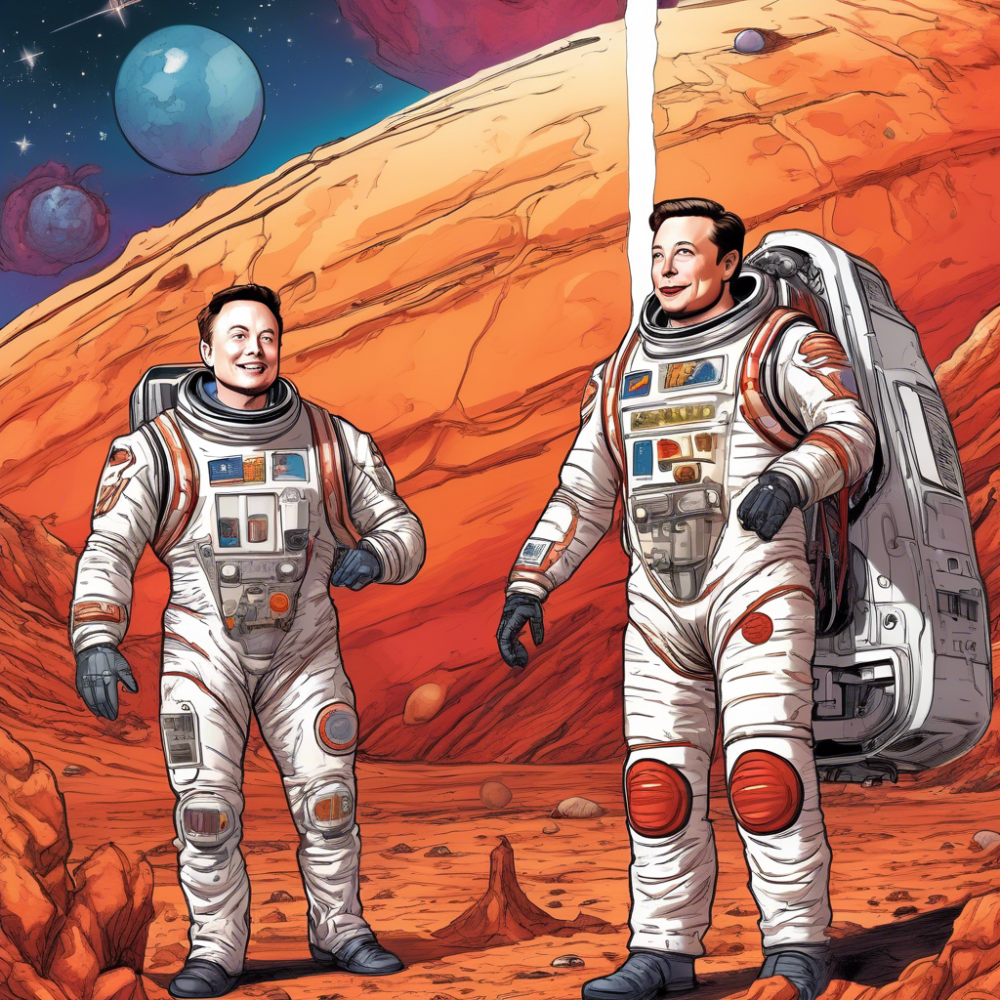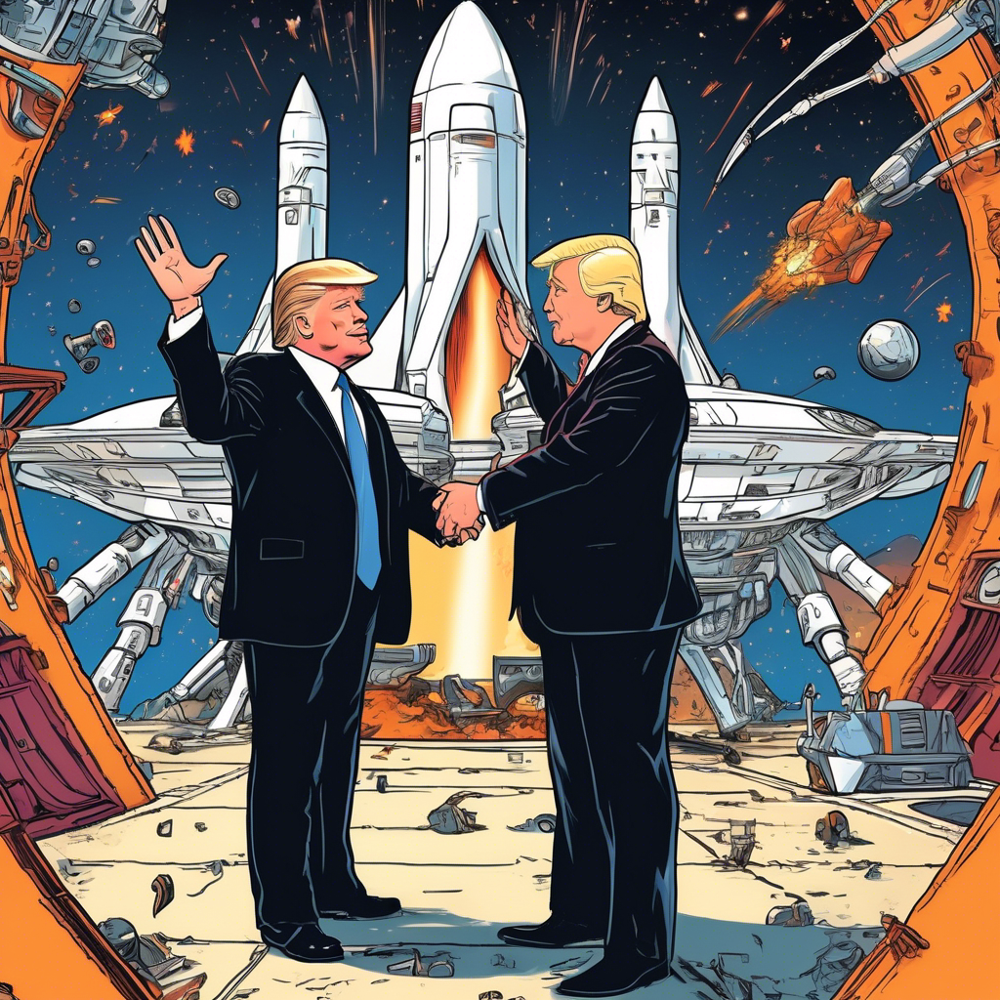

In [25]:
from IPython.display import Video

Video(output_path)